In [2]:
import os
from datetime import datetime, timedelta

import matplotlib.pyplot as plt
import xarray as xr
from matplotlib import dates as mdates
import numpy as np
import seaborn as sns

import learning_lidar.generation.generate_density_utils as gen_den_utils
import learning_lidar.generation.generation_utils as gen_utils
import learning_lidar.preprocessing.preprocessing_utils as prep_utils
from KDE_estimation_sample import kde_estimation_main
from learning_lidar.generation.generate_LC_pattern import generate_LC_pattern_main
import learning_lidar.generation.generate_bg_signals_utils as gen_bg_utils
from learning_lidar.utils import utils, xr_utils, vis_utils, global_settings as gs
vis_utils.set_visualization_settings()
TIMEFORMAT = mdates.DateFormatter(r'%H')

In [3]:
# TODO copy function back to vis_utils
def :plot_daily_profile_for_publish(profile_ds, height_slice=None, figsize=(15, 5),
                                save_fig=True, threshold=None, cbar_text=None):
    wavelengths = profile_ds.Wavelength.values
    if height_slice is None:
        height_slice = slice(profile_ds.Height[0].values, profile_ds.Height[-1].values)
    str_date = profile_ds.Time[0].dt.strftime("%Y-%m-%d").values.tolist()
    ncols = wavelengths.size
    fig, axes = plt.subplots(nrows=1, ncols=ncols, figsize=figsize, sharey=True)
    if ncols > 1:
        for col_index, (wavelength, ax) in enumerate(zip(wavelengths, axes.ravel())):
            ds = profile_ds.sel(Height=height_slice, Wavelength=wavelength)
            # try:
            #     ds.attrs['units'] = ds.attrs['units'].replace("km", r"\textbf{km}")
            # except Exception as e:
            #     print(e)
            ds.Height.attrs['units'] = ds.Height.attrs['units'].replace("km", r"\textbf{km}")

            if not threshold:
                threshold = ds.max()
                if not isinstance(threshold, int):
                    threshold = threshold.values
            if threshold>ds.max().item():
                extend = 'max'
            else:
                extend = 'neither'
            ds = xr.DataArray.clip(ds, max=threshold, keep_attrs=True)
            # ds = ds.where(ds<threshold)
            if col_index == 0:
                cbar_ax = fig.add_axes([.91, .15, .03, .7])

            ds.plot(cmap='turbo', ax=ax, vmin=0, vmax=threshold,
                    cbar_ax=cbar_ax, zorder=-20,extend=extend)
            ax.set_rasterization_zorder(-10)
            ax.xaxis.set_major_formatter(TIMEFORMAT)
            ax.xaxis.set_tick_params(rotation=0)
            ax.set_title("")
            ax.set_ylabel(ax.get_ylabel().replace("Height", r'\textbf{Height}'))
            ax.set_xlabel(ax.get_xlabel().replace("Time", r'\textbf{Time}'))
            for tick in ax.xaxis.get_majorticklabels():
                tick.set_horizontalalignment("left")
            if col_index != 0:
                ax.yaxis.label.set_visible(False)
    else:
        ax = axes
        ds = profile_ds.sel(Height=height_slice)
        # try:
        #     ds.attrs['units'] = ds.attrs['units'].replace("km", r"\textbf{km}")
        # except Exception as e:
        #     print(e)
        ds.Height.attrs['units'] = ds.Height.attrs['units'].replace("km", r"\textbf{km}")
        cbar_ax = fig.add_axes([.91, .15, .03, .7])
        if not threshold:
            threshold = ds.max()
        if not isinstance(threshold, int):
            threshold = threshold.values
            ds = xr.DataArray.clip(ds, max=threshold, keep_attrs=True)
            # ds = ds.where(ds<threshold)


        ds.plot(cmap='turbo', ax=ax,vmin=0, vmax=threshold, cbar_ax=cbar_ax, zorder=-20)
        ax.set_rasterization_zorder(-10)
        ax.xaxis.set_major_formatter(TIMEFORMAT)
        ax.xaxis.set_tick_params(rotation=0)
        ax.set_title("")
        ax.set_ylabel(ax.get_ylabel().replace("Height", r'\textbf{Height}'))
        ax.set_xlabel(ax.get_xlabel().replace("Time", r'\textbf{Time}'))
        for tick in ax.xaxis.get_majorticklabels():
            tick.set_horizontalalignment("left")

    if cbar_text:
        cbar_ax.set_ylabel(cbar_text)
        #cbar_ax.set_label(cbar_text)

    plt.ticklabel_format(axis="y", style="sci", scilimits=(0, 0))
    if ncols > 1:
        fig.tight_layout(rect=[0, 0, .9, 1])
    else:
        fig.tight_layout(rect=[0, 0, .87, 1])
    if save_fig:
        # clean_title = ''.join(char for char in suptitle if char.isalnum())
        suptitle = f"{profile_ds.info} - {str_date}"
        fig_path = os.path.join('figures', suptitle)
        print(f"Saving fig to {fig_path}")
        plt.savefig(fig_path + '.jpeg', bbox_inches='tight')
        plt.savefig(fig_path + '.svg', bbox_inches='tight')

    # plt.suptitle(suptitle)
    plt.show()
    return fig_path

In [4]:
gen_den_utils.PLOT_RESULTS = True
station_name = 'haifa'
the_date = '2017-05-16'
station = gs.Station(station_name)
day_date  = datetime.fromisoformat(the_date)

os.makedirs('figures', exist_ok=True)

# Load the necessary datasets - signal, lidar, aerosol, bg, density, molecular, density_params
ds_day_params = gen_utils.get_daily_gen_param_ds(station=station, day_date=day_date, type_='density_params')

bg_year_params_path = os.path.join(station.generation_folder, f'generated_bg_{station.name}_2017-01-01_2017-12-31.nc')
bg_year_params_ds = xr_utils.load_dataset(bg_year_params_path)

signal_ds = gen_utils.get_daily_gen_ds(station, day_date, type_='signal')
lidar_ds = gen_utils.get_daily_gen_ds(station, day_date, type_='lidar')
density_ds = gen_utils.get_daily_gen_ds(station, day_date, type_='density')

mol_folder = prep_utils.get_month_folder_name(station.molecular_dataset, day_date)
nc_mol = fr"{day_date.strftime('%Y_%m_%d')}_{station.location}_molecular.nc"
mol_ds = xr_utils.load_dataset(os.path.join(mol_folder, nc_mol))

In [6]:
HOME_DIR = os.path.abspath(os.path.join(os.getcwd(), os.pardir, os.pardir))
DATA_DIR = os.path.join(HOME_DIR, 'data')

parser = utils.get_base_arguments()
parser.add_argument('--extended_smoothing_bezier', action='store_true',
                    help='Whether to do extended smoothing bezier')
args = parser.parse_args(["-n", station_name, "--plot_results",
                          "--start_date", "2017-09-01", "--end_date", "2017-10-31"])
kde_estimation_main(args, month=9, year=2017, data_folder=DATA_DIR)

#args = parser.parse_args(["-n", station_name, "--plot_results",
#                          "--start_date", "2017-04-01", "--end_date", "2017-05-31"])
#kde_estimation_main(args, month=4, year=2017, data_folder=DATA_DIR)


#args = parser.parse_args(["-n", station_name, "--plot_results",
#                          "--start_date", "2017-04-01", "--end_date", "2017-05-31"])
#kde_estimation_main(args, month=5, year=2017, data_folder=DATA_DIR)

KeyboardInterrupt: 

Saving fig to figures\Daily Angstrom Exponents - 2017-09-01


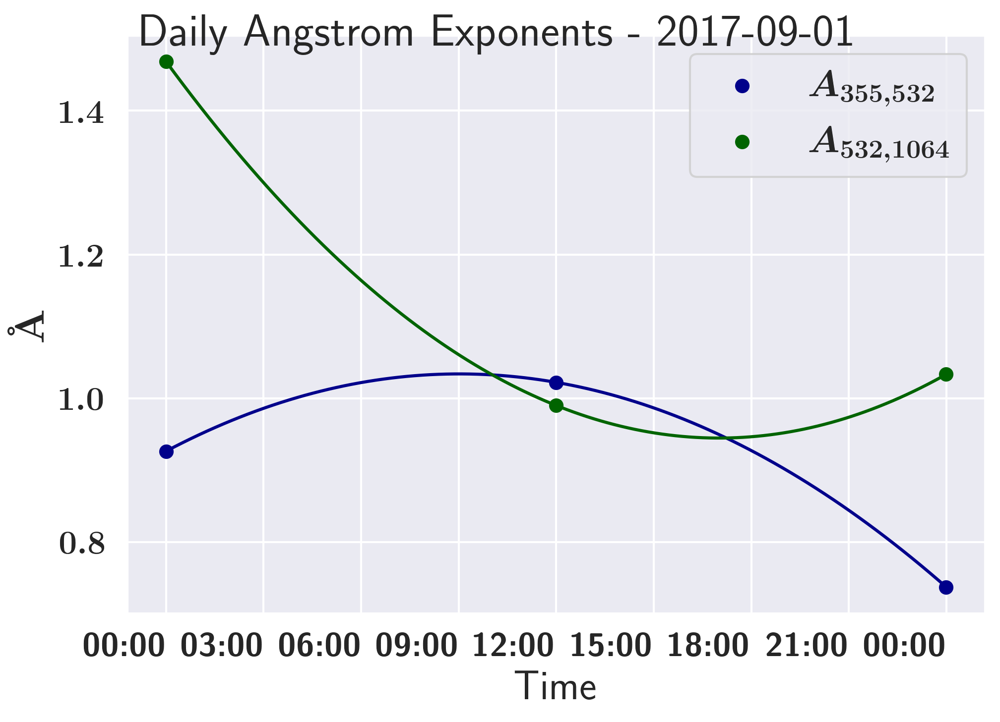

Saving fig to figures\Daily Lidar Ratio - 2017-09-01


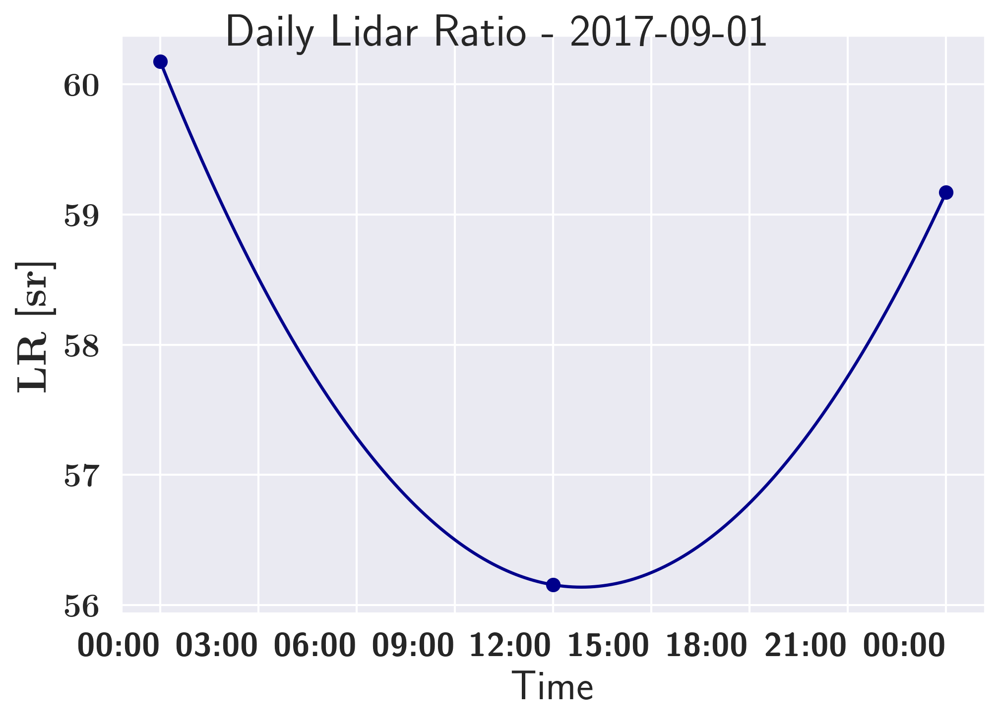

<xarray.Dataset>
Dimensions:  (Time: 2880)
Coordinates:
  * Time     (Time) datetime64[ns] 2017-09-01 ... 2017-09-01T23:59:30
Data variables:
    LR       (Time) float64 60.18 60.17 60.17 60.16 ... 59.15 59.16 59.16 59.17
    date     datetime64[ns] 2017-09-01
Attributes:
    info:      Daily Lidar Ratio
    location:  Haifa

In [4]:
gen_den_utils.get_angstrom_ds(station, day_date, ds_day_params)
gen_den_utils.get_LR_ds(station, day_date, ds_day_params)

<ipython-input-5-8ef6083beac8>:17: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[0, 0, .9, 1])


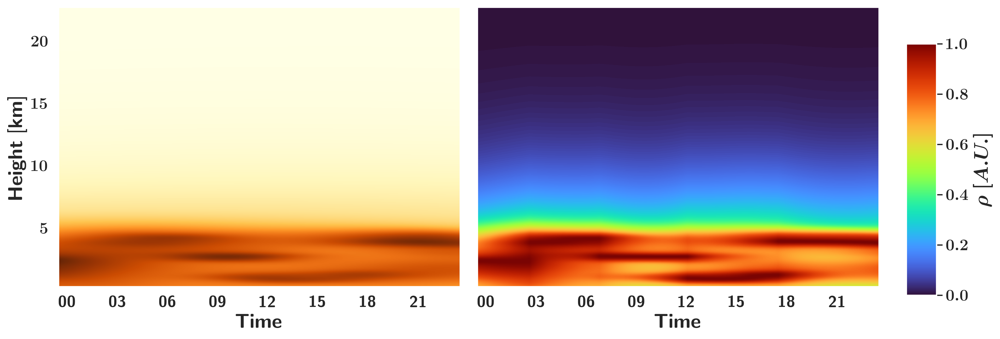

In [5]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(14, 5), sharey=True)

cbar_ax = fig.add_axes([.91, .15, .03, .7])
density_ds.rho.plot(cmap='YlOrBr', ax=axes[0], cbar_ax=cbar_ax,zorder=-20)
density_ds.rho_tnorm.plot(cmap='turbo', ax=axes[1], cbar_ax=cbar_ax,zorder=-20)
for ax in axes:
    ax.set_rasterization_zorder(-10)
    ax.xaxis.set_major_formatter(TIMEFORMAT)
    ax.xaxis.set_tick_params(rotation=0)
    ax.set_ylabel(ax.get_ylabel().replace("Height", r'\textbf{Height}').replace("km", r'\textbf{km}'))
    ax.set_xlabel(ax.get_xlabel().replace("Time", r'\textbf{Time}'))
    for tick in ax.xaxis.get_majorticklabels():
        tick.set_horizontalalignment("left")

axes[1].yaxis.label.set_visible(False)

fig.tight_layout(rect=[0, 0, .9, 1])

title = fr"rho_rho_TN_{day_date.strftime('%Y-%m-%d')}"
#plt.savefig(os.path.join('figures', title+'.jpeg'))
#plt.savefig(os.path.join('figures', title+'.svg'))
plt.show()

In [1]:
for day_ in ['2017-04-04', '2017-05-16', '2017-10-02']:
    aerosol_ds = gen_utils.get_daily_gen_ds(station, datetime.fromisoformat(day_), type_='aerosol')
    :plot_daily_profile_for_publish(aerosol_ds.sigma,
                            cbar_text=r'$\alpha [1/{\rm km}]$')

NameError: name 'gen_utils' is not defined

<ipython-input-1-64b64b7a1b5b>:116: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[0, 0, .87, 1])


Saving fig to figures\Molecular attenuation coefficient - 2017-09-01


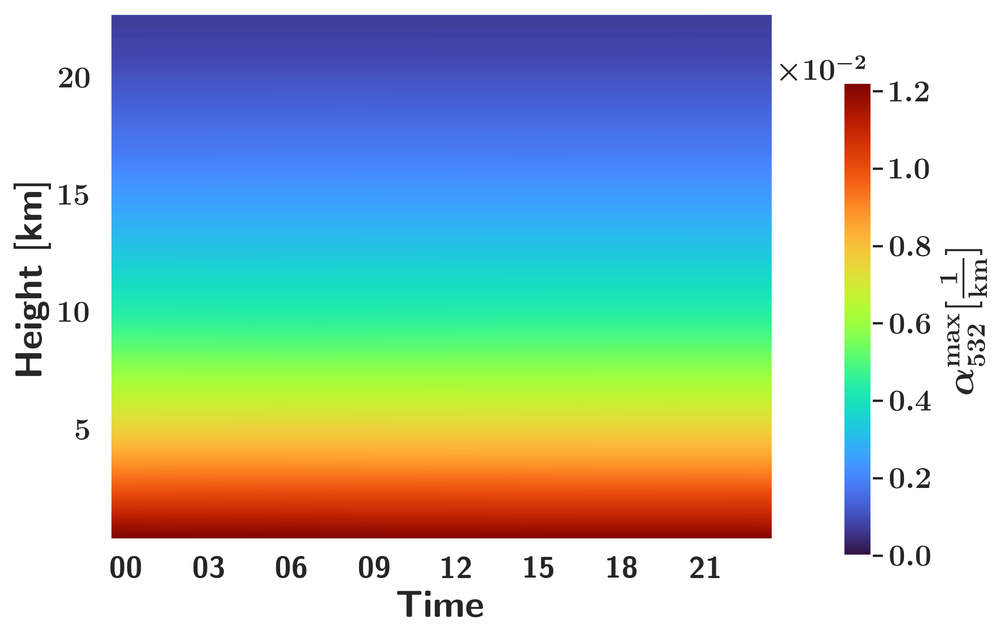

'figures\\Molecular attenuation coefficient - 2017-09-01'

In [7]:
# :plot_daily_profile_for_publish(mol_ds.beta.sel(Wavelength=355), figsize=(9,6))
:plot_daily_profile_for_publish(mol_ds.sigma.sel(Wavelength=532), figsize=(7,5),
                            cbar_text=r'$\alpha_{532}^{\rm max} [\frac{1}{\rm km}]$')

<ipython-input-1-64b64b7a1b5b>:114: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[0, 0, .9, 1])


Saving fig to figures\Daily total attenuated backscatter coefficient - 2017-09-01


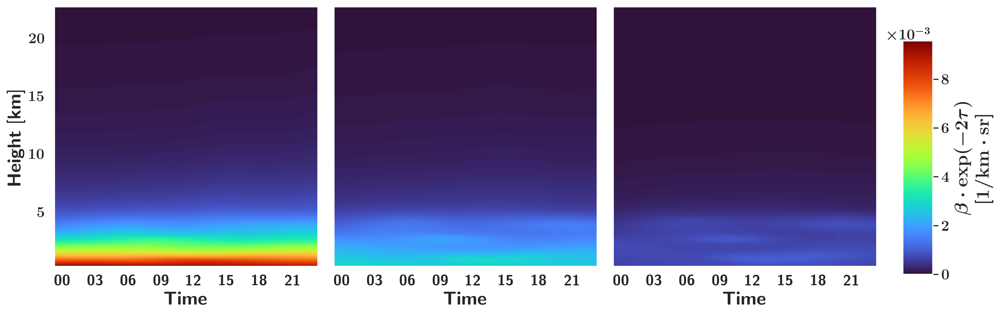

'figures\\Daily total attenuated backscatter coefficient - 2017-09-01'

In [8]:
signal_ds.attbsc.attrs['units'] = r"$1/{\rm km} \cdot {\rm sr}$"
:plot_daily_profile_for_publish(signal_ds.attbsc)

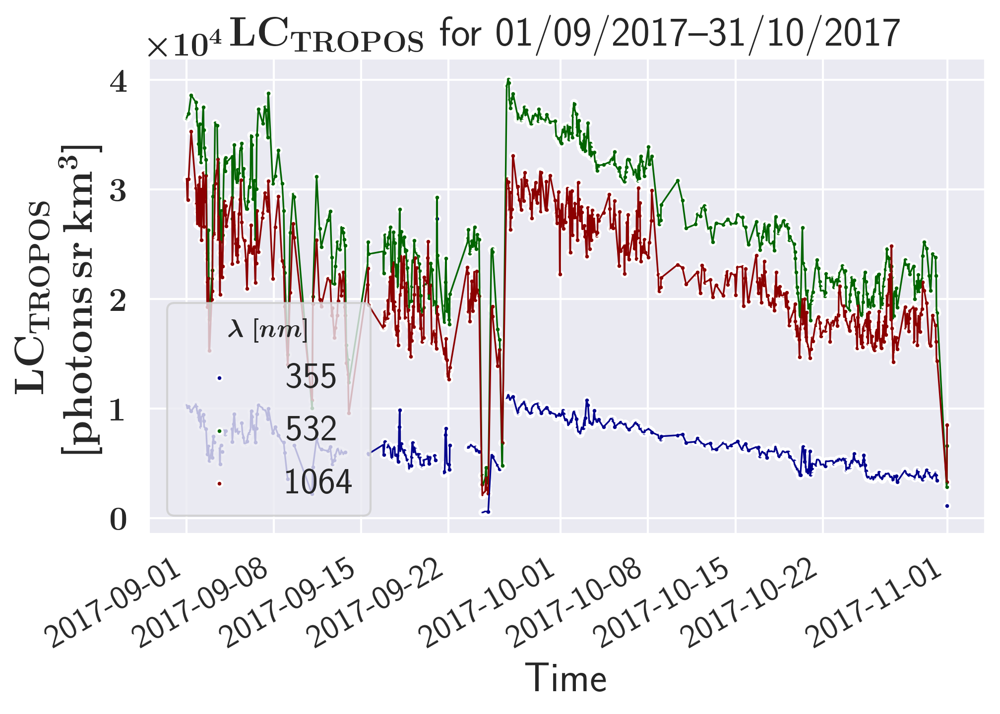

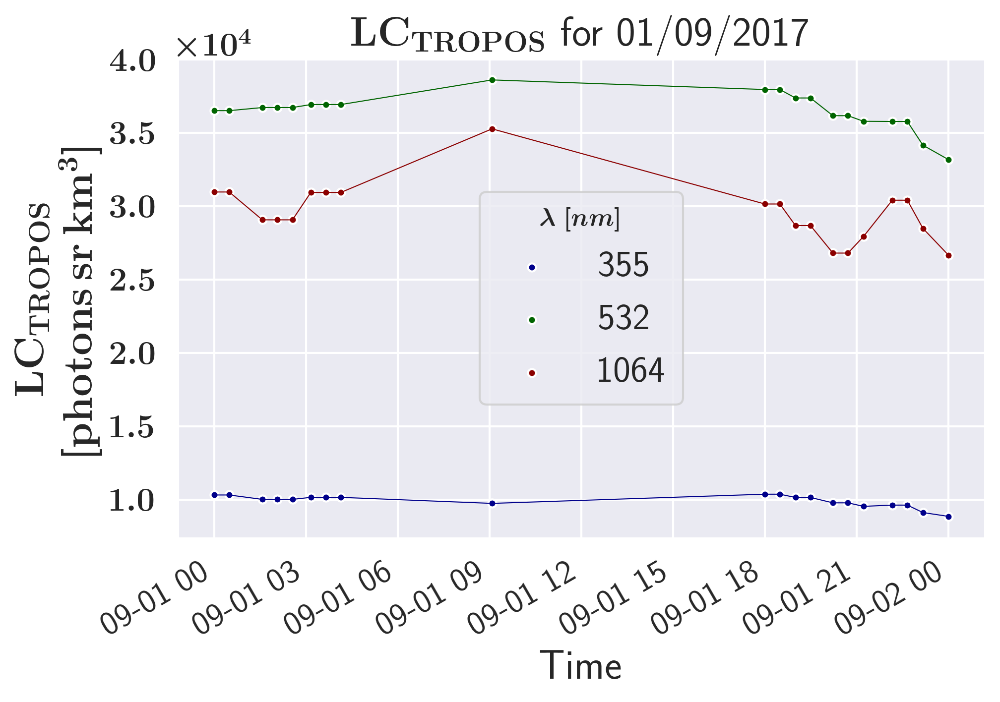

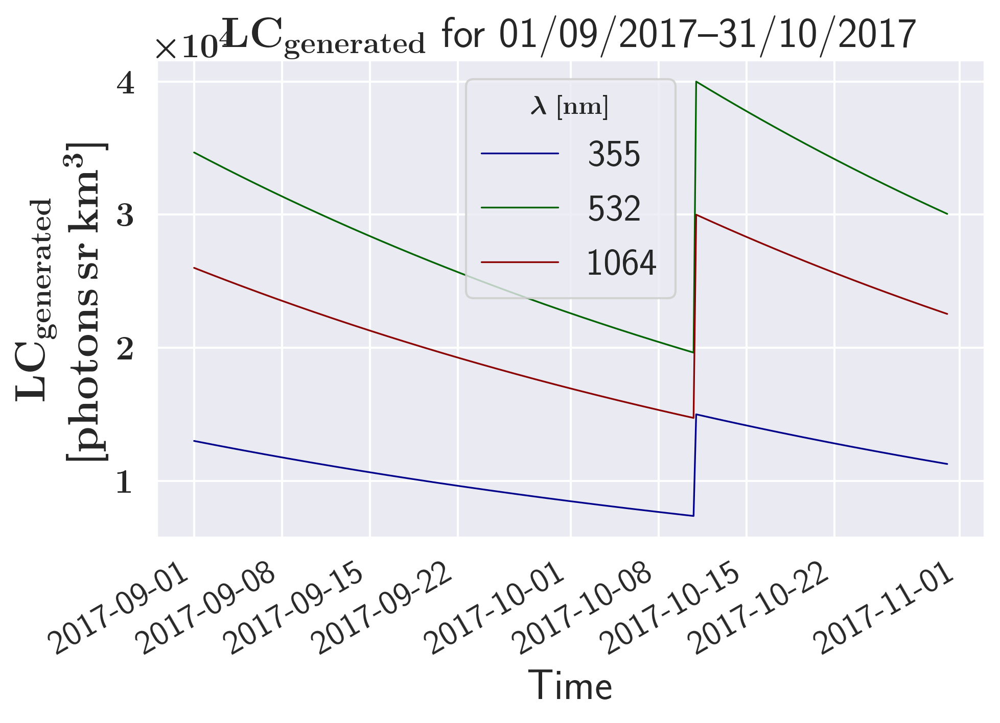

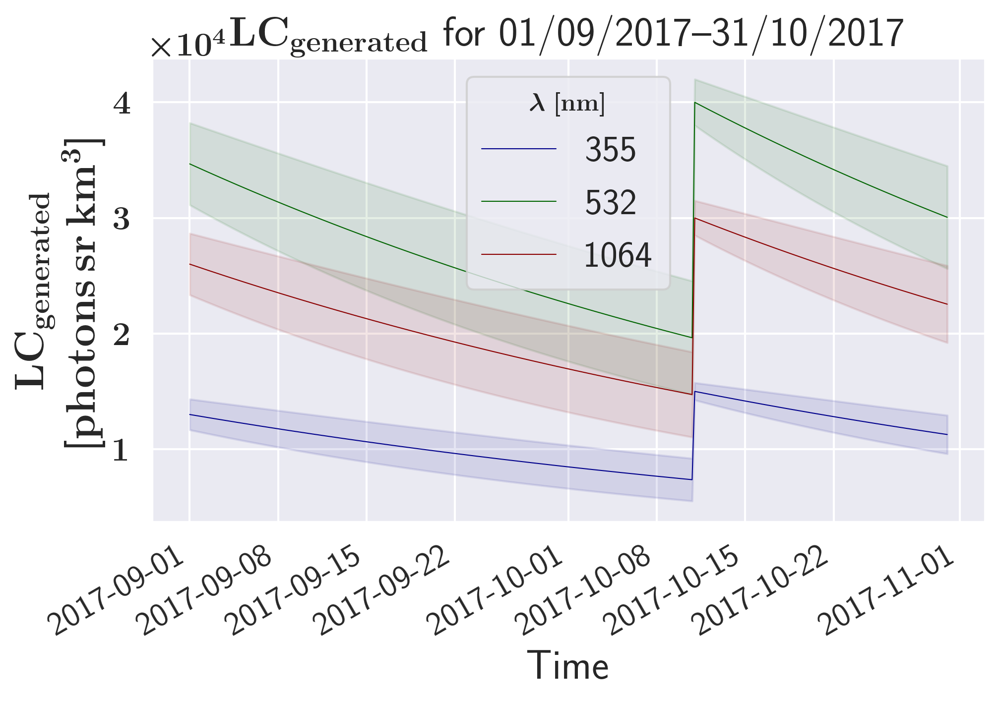

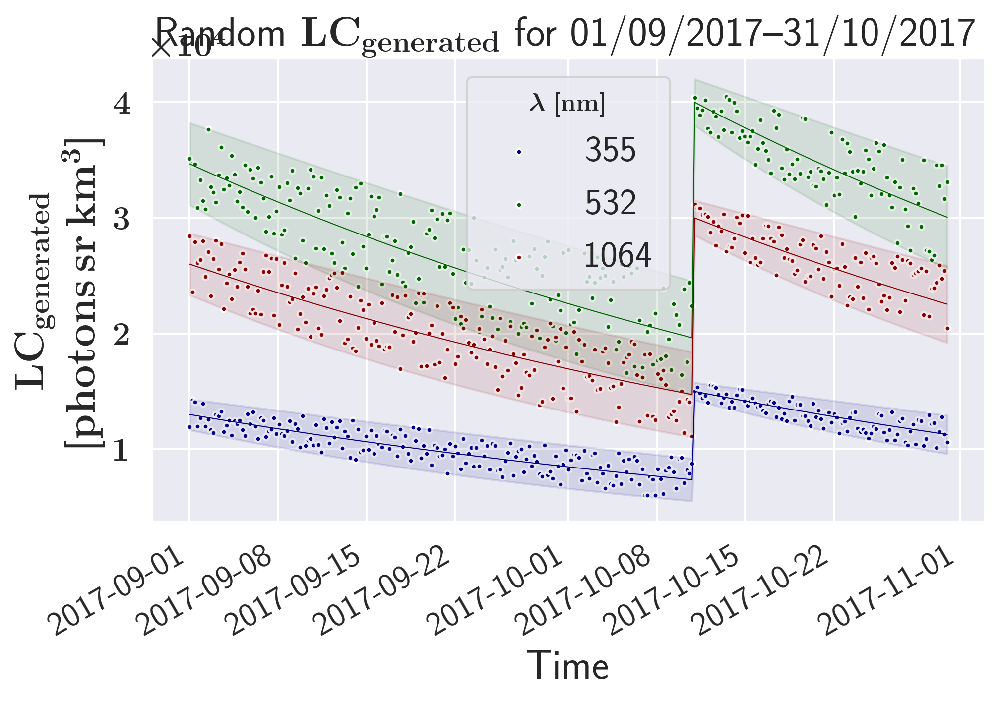

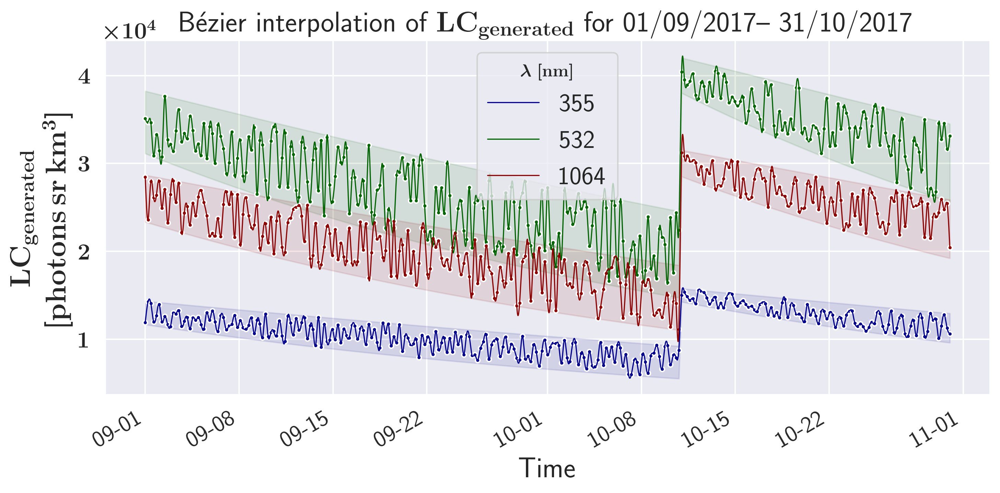

Saving fig to figures\pLC_gen_PICASSO_09-10_2017


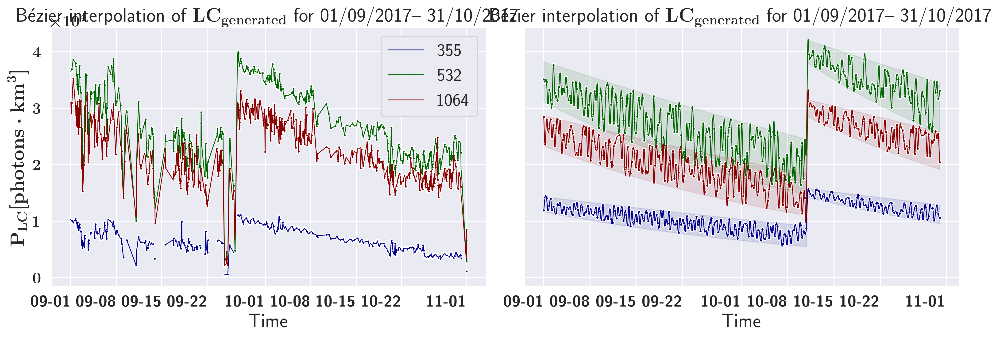

In [9]:
parser = utils.get_base_arguments()
args = parser.parse_args(["-n", station_name, "--plot_results", "--start_date", "2017-09-01", "--end_date", "2017-10-31"])
generate_LC_pattern_main(params=args)

<ipython-input-1-64b64b7a1b5b>:116: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[0, 0, .87, 1])


Saving fig to figures\Raw Range Corrected Lidar Signal - 2017-09-12


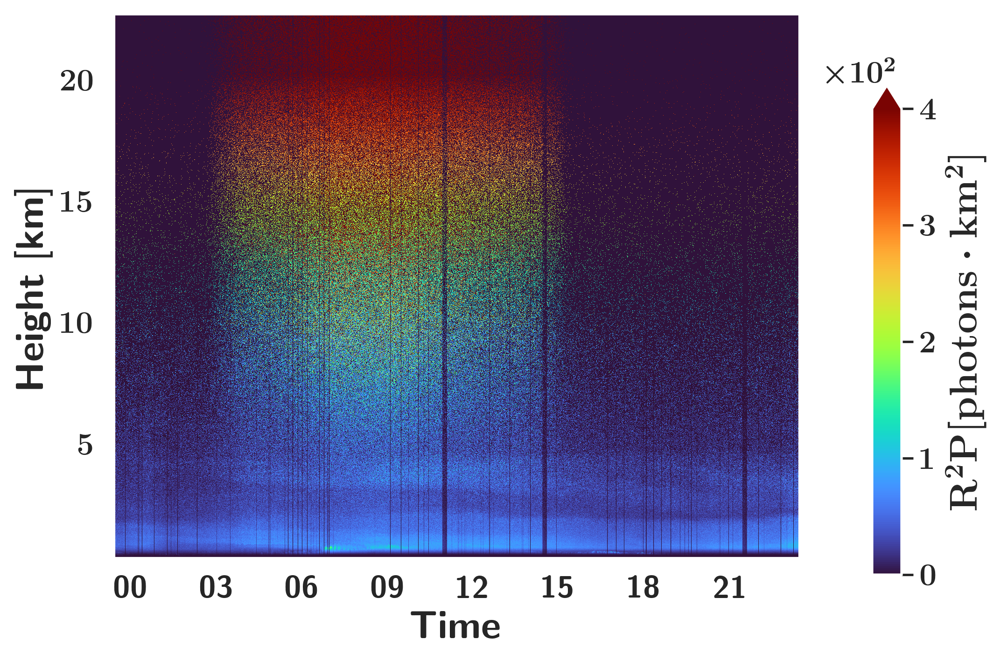

In [11]:
dates_real =["2017-09-12"] # ["2017-09-01","2017-09-12","2017-09-13","2017-09-20","2017-09-28"]
for dt_real in dates_real:
    day_path = dt_real.replace("-","_") + '_Haifa_lidar.nc'
    folder_path = r'D:\data_haifa\DATA FROM TROPOS\lidar_dataset\2017\09'
    real_ds = xr.load_dataset(os.path.join(folder_path,day_path))
    :plot_daily_profile_for_publish(real_ds.sel(Wavelength = 532).range_corr,threshold=400,figsize=(7, 5),
                            cbar_text=r'${\rm R^2 P [photons \cdot km^2]}$')

In [12]:
# TODO - generate_overlap_params(n_samples = 8) from overlap notebook

Saving fig to figures\BG_2017-03-21


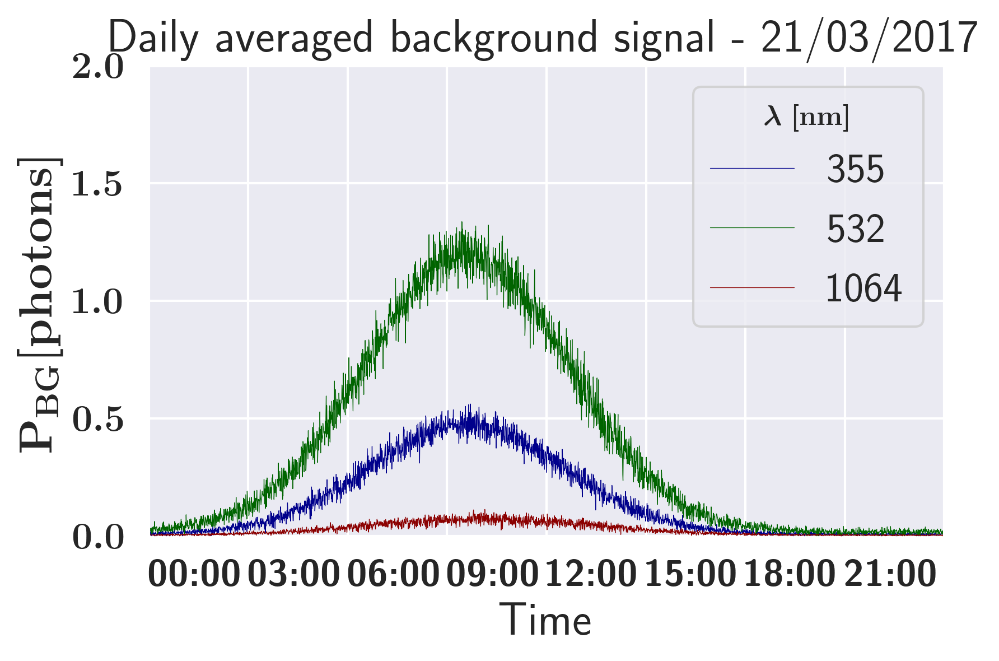

Saving fig to figures\BG_2017-04-04


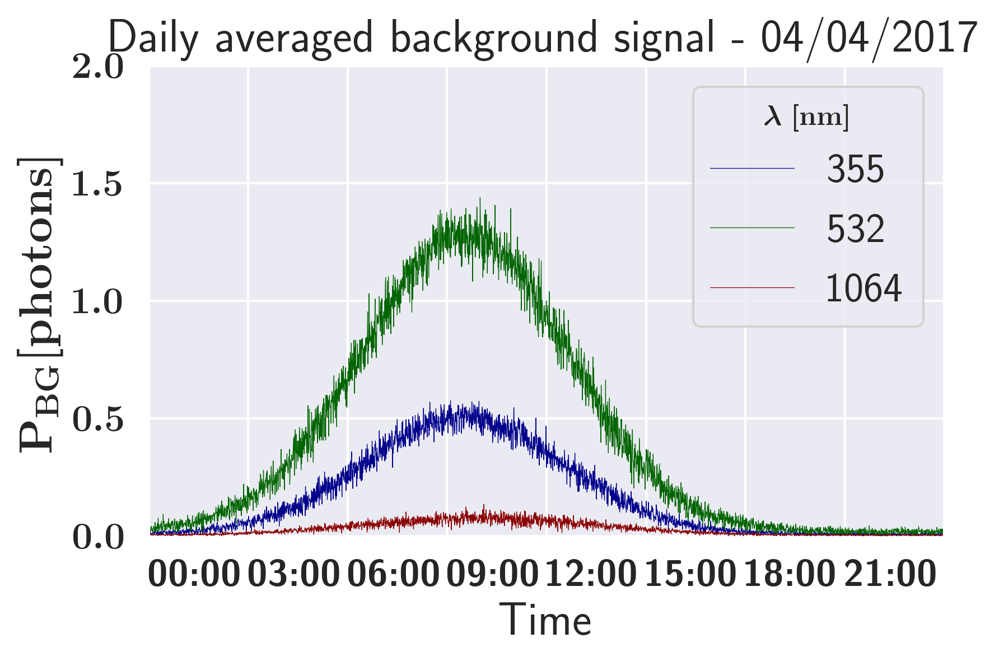

Saving fig to figures\BG_2017-06-21


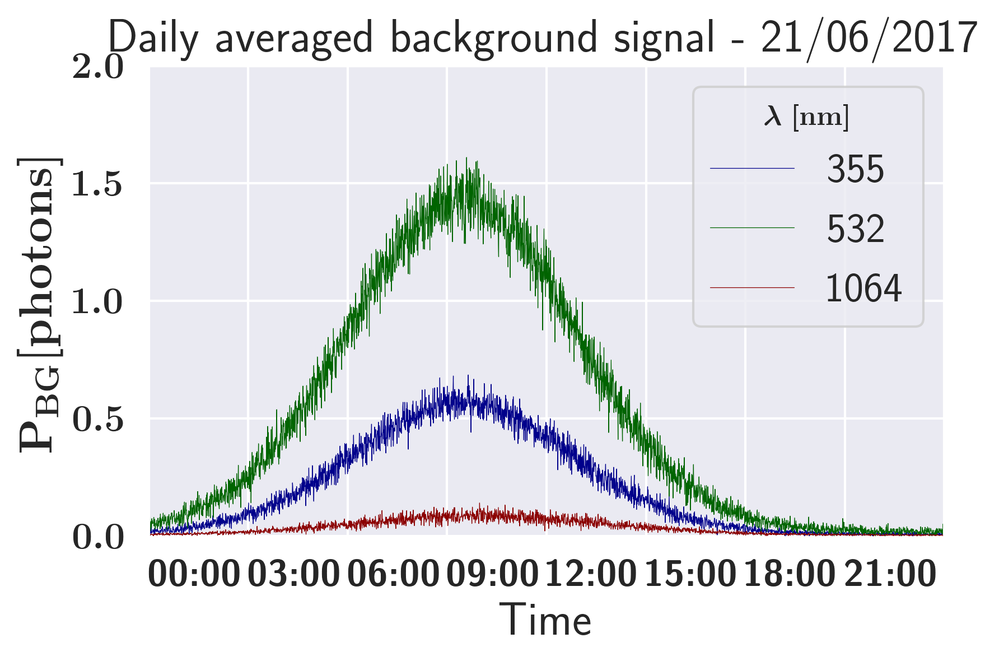

Saving fig to figures\BG_2017-09-21


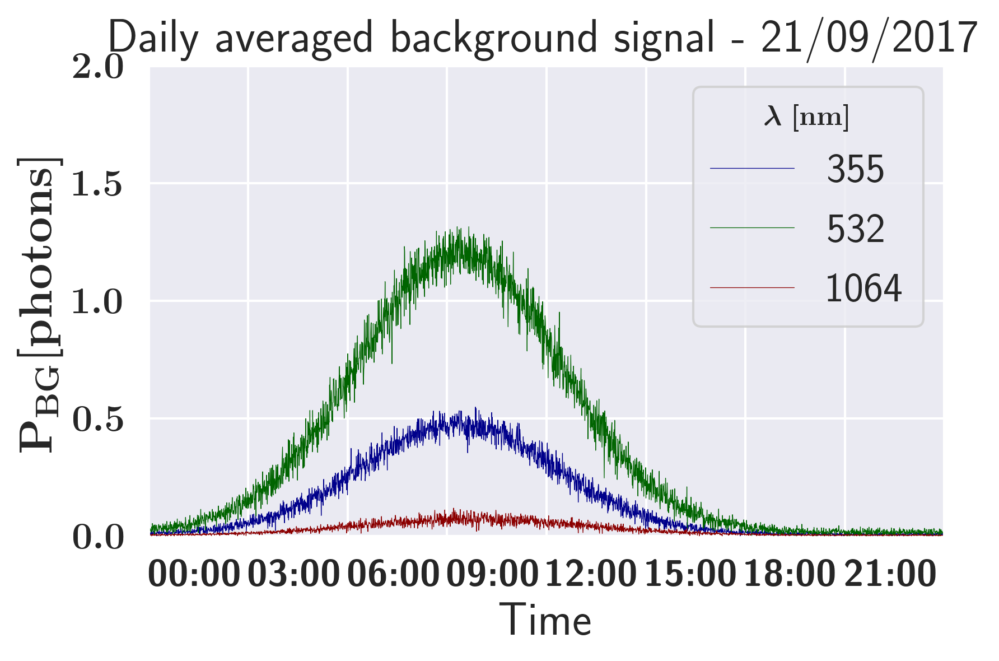

Saving fig to figures\BG_2017-12-21


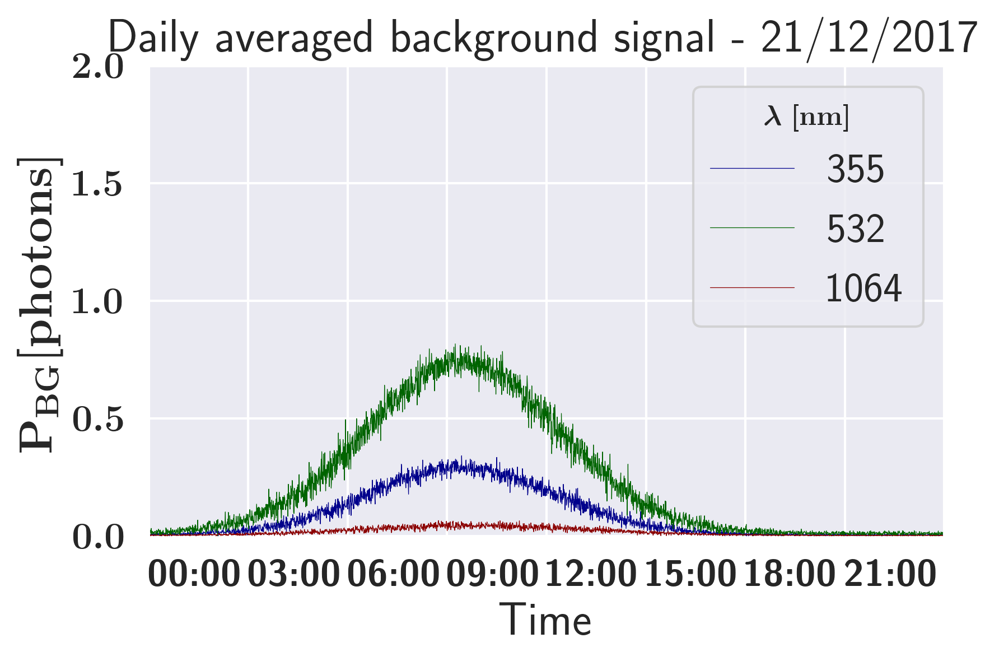

In [13]:
for day_ in ['2017-03-21', '2017-04-04','2017-06-21', '2017-09-21', '2017-12-21']:
    gen_bg_utils.plot_bg_one_day(bg_year_params_ds, datetime.fromisoformat(day_))

Saving fig to figures\BG_2017-03-21


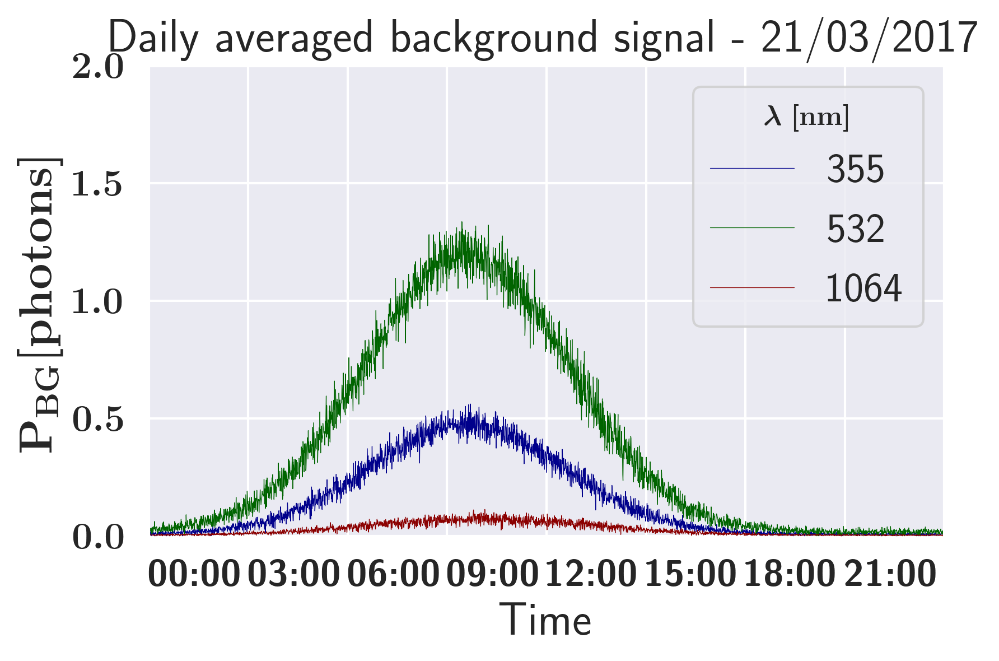

Saving fig to figures\BG_2017-04-04


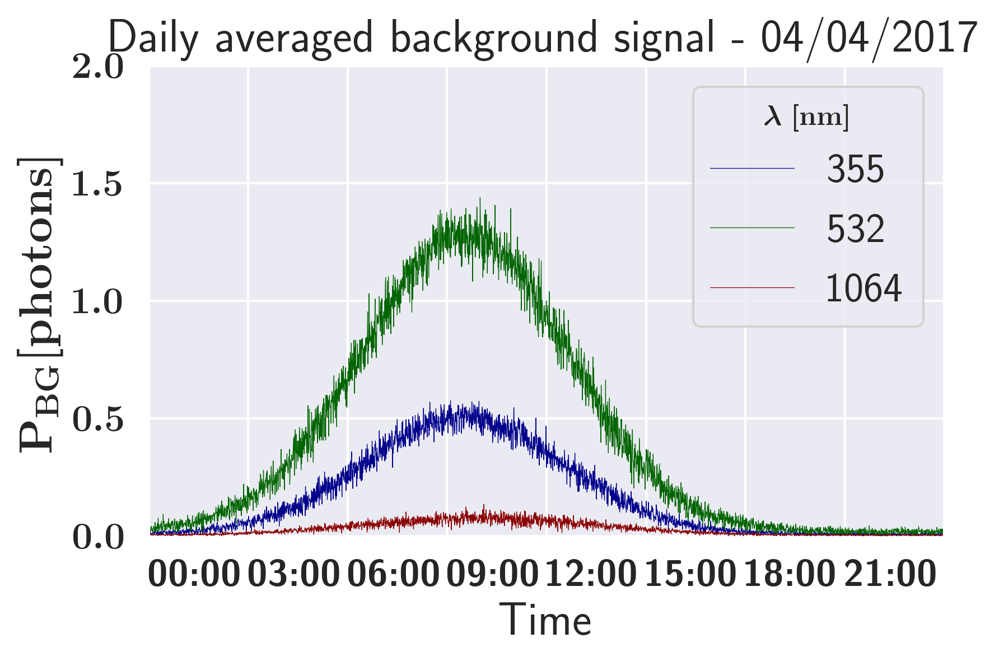

Saving fig to figures\BG_2017-06-21


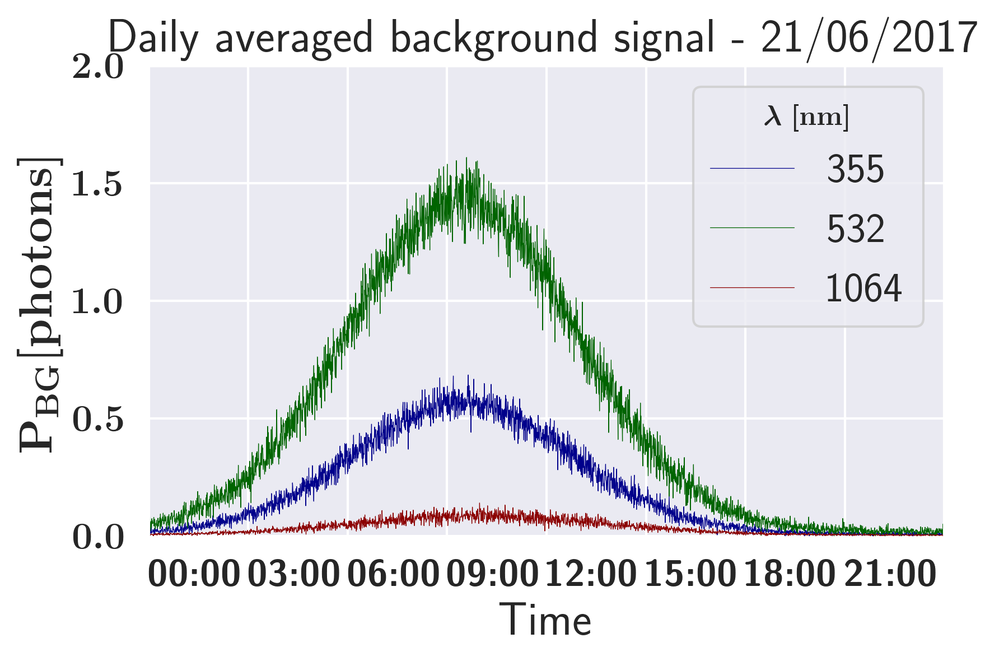

Saving fig to figures\BG_2017-09-21


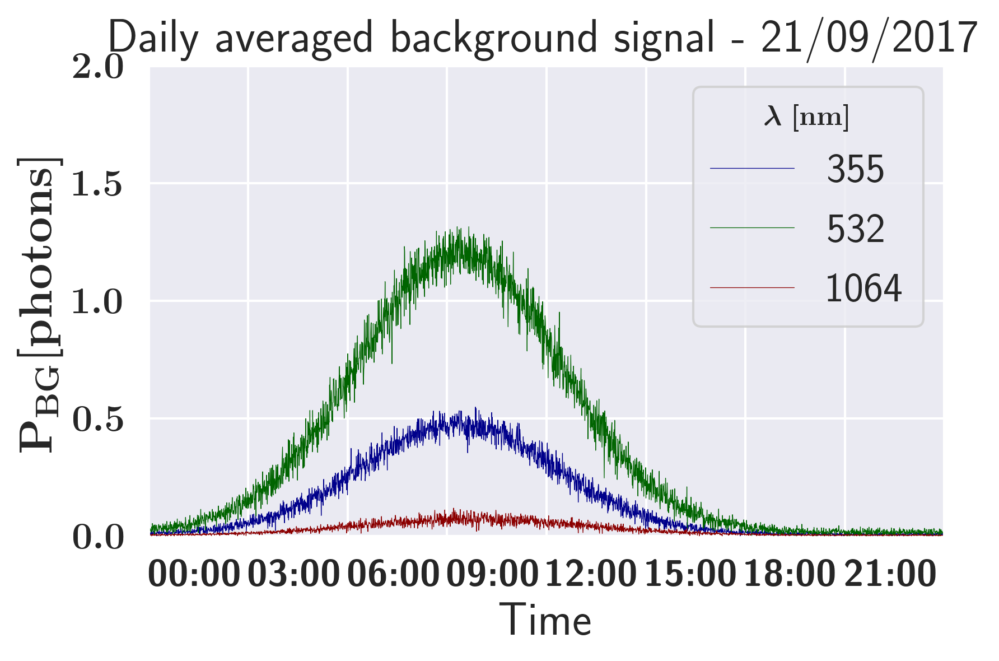

Saving fig to figures\BG_2017-12-21


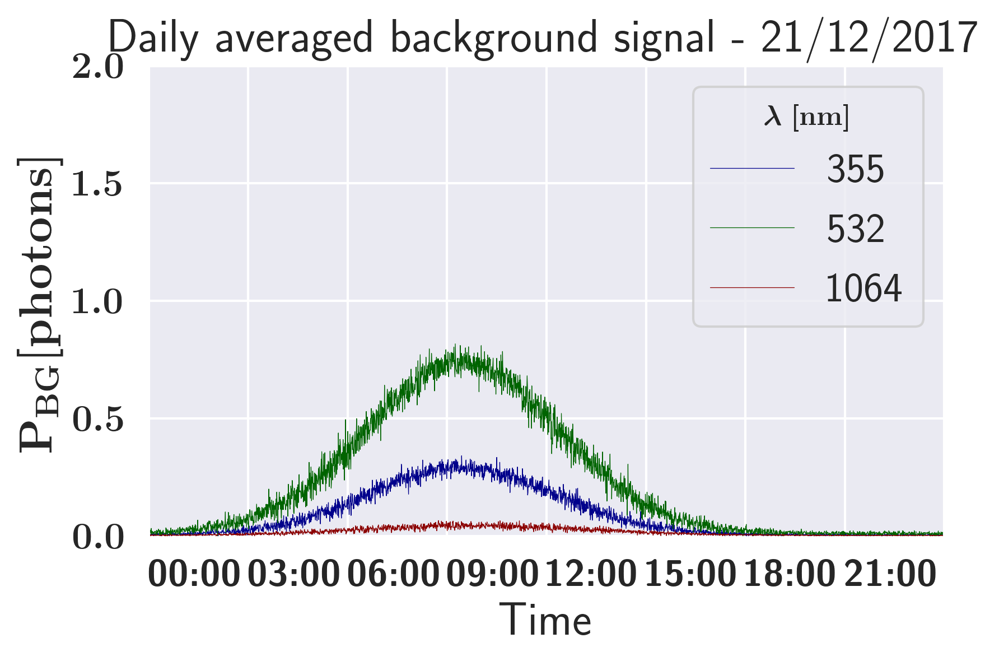

In [14]:
for day_ in ['2017-03-21', '2017-04-04','2017-06-21', '2017-09-21', '2017-12-21']:
    gen_bg_utils.plot_bg_one_day(bg_year_params_ds, datetime.fromisoformat(day_))

Saving fig to figures\BG_2017


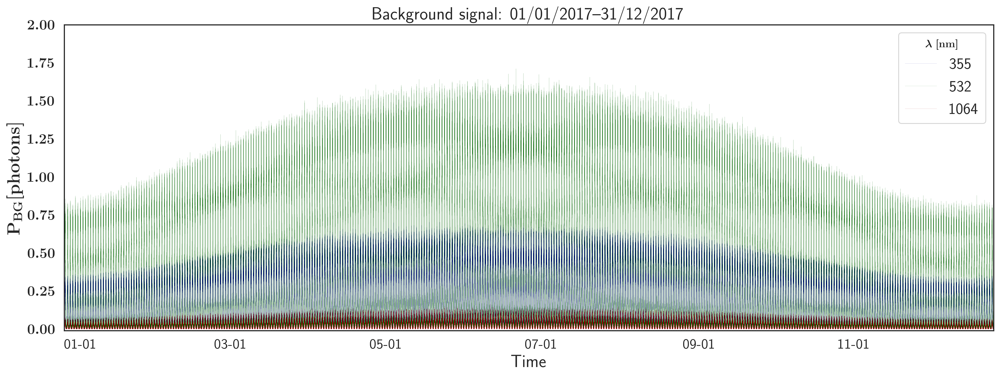

In [15]:
c_day = datetime(2017, 1, 1)
gen_bg_utils.plot_bg_part_of_year(bg_year_params_ds, dslice=slice(c_day, c_day + timedelta(days=365) - timedelta(seconds=30)))



C:\Users\addalin\AppData\Local\Temp\ipykernel_6612\4152535654.py:77: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[0, 0, .9, 1])


Saving fig to figures\Generated Range Corrected Lidar Signal - 2017-04-15


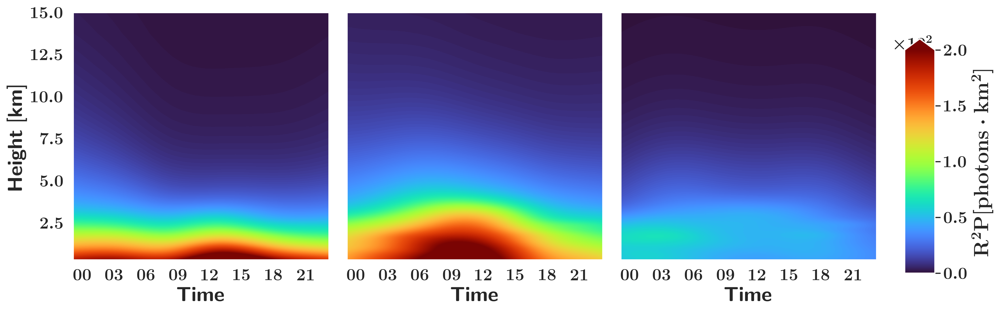

'figures\\Generated Range Corrected Lidar Signal - 2017-04-15'

In [57]:
day_date = datetime(2017,4,15)
signal_ds = gen_utils.get_daily_gen_ds(station, day_date, type_='signal')
:plot_daily_profile_for_publish(signal_ds.range_corr,height_slice=slice(0,15),threshold=200,
                            cbar_text=r'${\rm R^2 P [photons \cdot km^2]}$')

C:\Users\addalin\AppData\Local\Temp\ipykernel_6612\4152535654.py:77: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[0, 0, .9, 1])


Saving fig to figures\Generated Poisson Range Corrected Lidar Signal - 2017-10-15


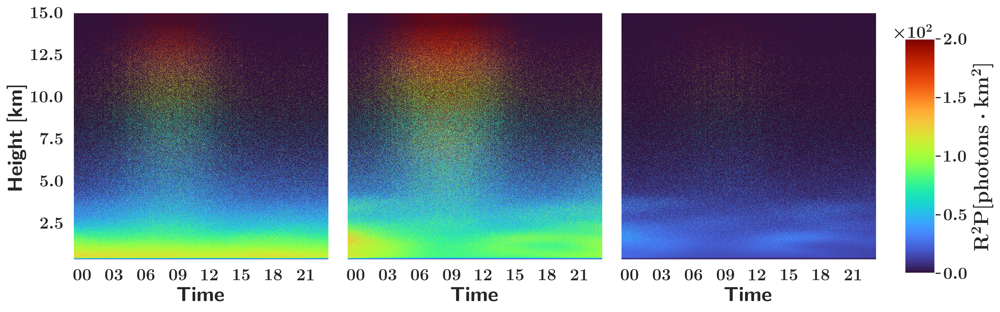

'figures\\Generated Poisson Range Corrected Lidar Signal - 2017-10-15'

In [59]:
day_date = datetime(2017,10,15)
lidar_ds = gen_utils.get_daily_gen_ds(station, day_date, type_='lidar')
:plot_daily_profile_for_publish(lidar_ds.range_corr, threshold=200,height_slice=slice(0,15),
                            cbar_text=r'${\rm R^2 P [photons \cdot km^2]}$')

C:\Users\addalin\AppData\Local\Temp\ipykernel_6612\3305819911.py:73: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[0, 0, .87, 1])


Saving fig to figures\Generated Poisson Range Corrected Lidar Signal - 2017-05-16


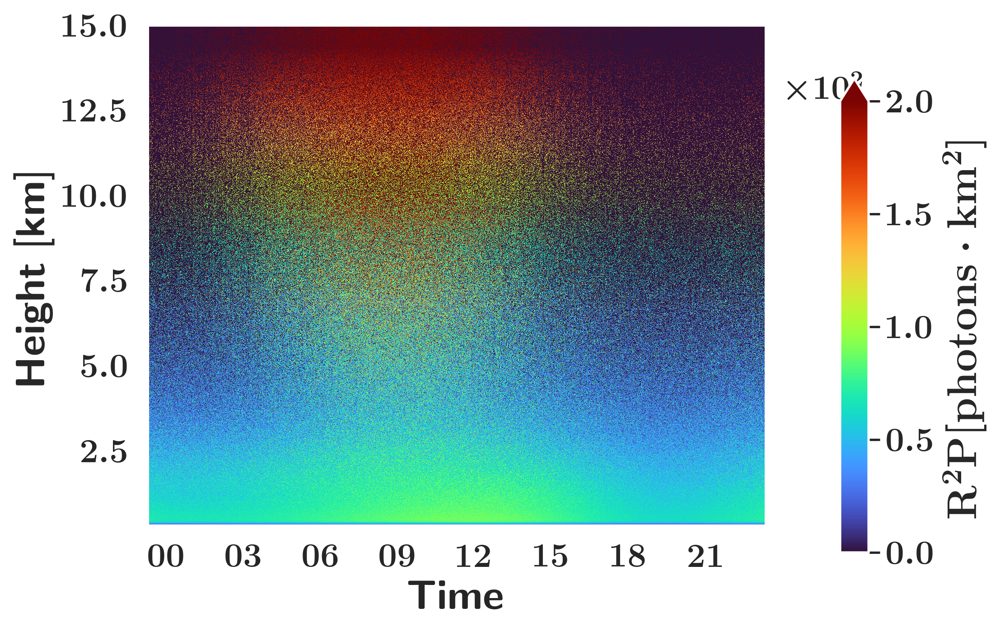

In [15]:
fig_path = :plot_daily_profile_for_publish(lidar_ds.sel(Wavelength=532).range_corr,
                            threshold=200, figsize= (7,5),height_slice=slice(0,15),
                            cbar_text=r'${\rm R^2 P [photons \cdot km^2]}$')

In [20]:
fig_path = r'C:\Users\addalin\Dropbox\Apps\Overleaf\LiDMGen -Opex\figures\Generated Poisson Range Corrected Lidar Signal - 2017-09-01'
from PIL import Image
def tnails(fig_path):
   try:
      fname_source = fig_path+'.jpg'
      print(fname_source)
      image = Image.open(fname_source)
      image.thumbnail((100,100))
      image.save(fig_path+'_thumbnail.jpg')
      image1 = Image.open(fig_path+'_thumbnail.jpg')
      image1.show()
   except IOError:
      pass
tnails(fig_path)

C:\Users\addalin\Dropbox\Apps\Overleaf\LiDMGen -Opex\figures\Generated Poisson Range Corrected Lidar Signal - 2017-09-01.jpg


Saving fig to figures\Daily Angstrom Exponents - comparison


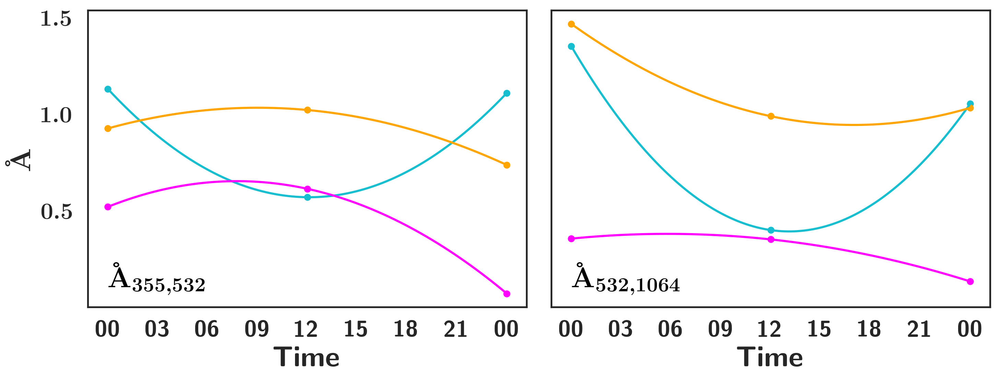

Saving fig to figures\Daily Lidar Ratio - comparison


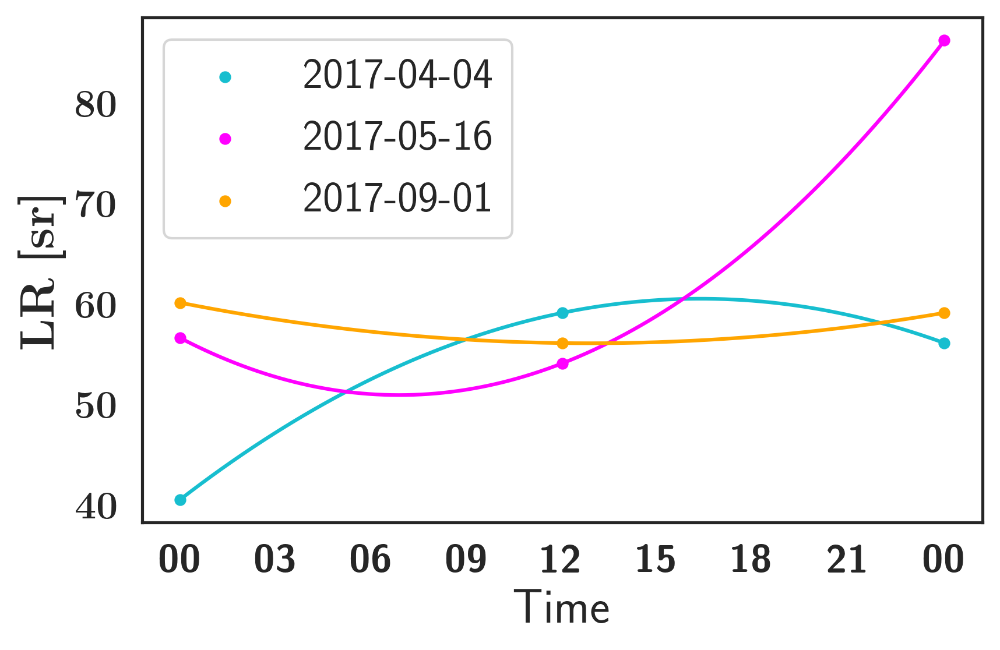

In [21]:
nbins = station.total_time_bins
gen_den_utils.PLOT_RESULTS = False
sns.set_palette(sns.color_palette(['tab:cyan', 'magenta', 'orange']))
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(10, 4), sharey=True)

for index, day_ in enumerate(['2017-04-04', '2017-05-16', '2017-09-01']):
    day_params_ds = gen_utils.get_daily_gen_param_ds(station=station, day_date=datetime.fromisoformat(day_), type_='density_params')
    ang_ds = gen_den_utils.get_angstrom_ds(station, datetime.fromisoformat(day_), day_params_ds)
    if index == 0:
        time_index = station.calc_daily_time_index(datetime.fromisoformat(day_))
        tbins = np.round([int(gen_utils.dt2binscale(utils.dt64_2_datetime(dt))) for
                          dt in day_params_ds.ang355532.Time.values])
        tbins[2] -= 1
        times = time_index[tbins].values

    ax[0].scatter(times, day_params_ds.ang355532.values, label=day_, s=15)
    ax[0].plot(time_index, ang_ds.ang_355_532.values)
    ax[0].xaxis.set_major_formatter(TIMEFORMAT)
    ax[0].xaxis.set_tick_params(rotation=0)
    ax[0].set_ylabel(r'${\rm \AA}$')
    ax[0].set_xlabel(r'\textbf{Time}')
    ax[0].annotate(r"${\rm \AA}_{355, 532}$",
                fontweight='bold', fontsize=20, color='black',
                xy=(time_index[5], 0.15),
                va="center",
                bbox=dict(boxstyle='round,pad=0.2', fc=[1, 1, 1], ec="none"),)

    # ang_ds.ang_532_1064.plot(ax=ax[1])
    ax[1].scatter(times, day_params_ds.ang5321064.values, label=day_, s=15)
    ax[1].plot(time_index, ang_ds.ang_532_1064.values)
    ax[1].xaxis.set_major_formatter(TIMEFORMAT)
    ax[1].xaxis.set_tick_params(rotation=0)
    ax[1].set_xlabel(r'\textbf{Time}')
    ax[1].annotate(r"${\rm \AA}_{532, 1064}$",
                fontweight='bold', fontsize=20, color='black',
                xy=(time_index[5], 0.15),
                va="center",
                bbox=dict(boxstyle='round,pad=0.2', fc=[1, 1, 1], ec="none"),)

    str_date = ang_ds.Time[0].dt.strftime("%Y-%m-%d").values.tolist()
title = f"{ang_ds.attrs['info']} - comparison"
# plt.legend()
plt.tight_layout()
fig_path = os.path.join('figures', title)
print(f"Saving fig to {fig_path}")
plt.savefig(fig_path+'.svg')
plt.savefig(fig_path+'.jpeg')
# plt.suptitle(title)
plt.show()

fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(6, 4))

for index, day_ in enumerate(['2017-04-04', '2017-05-16', '2017-09-01']):
    curr_day = datetime.fromisoformat(day_)
    day_params_ds = gen_utils.get_daily_gen_param_ds(station=station, day_date=curr_day, type_='density_params')
    LR_ds = gen_den_utils.get_LR_ds(station, curr_day, day_params_ds)
    LRs = day_params_ds.LR.values

    if index == 0:
        time_index = station.calc_daily_time_index(curr_day)
        tbins = np.round([int(gen_utils.dt2binscale(utils.dt64_2_datetime(dt))) for
                          dt in day_params_ds.LR.Time.values])
        tbins[2] -= 1
        times = time_index[tbins].values


    ax.plot(time_index, LR_ds.LR.values)
    ax.scatter(times, LRs, label=day_, s=15)
    ax.xaxis.set_major_formatter(TIMEFORMAT)
    ax.xaxis.set_tick_params(rotation=0)
    ax.set_ylabel(LR_ds.LR.attrs['long_name']+f" [{LR_ds.LR.attrs['units']}]")
    ax.set_xlabel('Time')

plt.legend()
plt.tight_layout()
title = f"{LR_ds.attrs['info']} - comparison"

fig_path = os.path.join('figures', title)
print(f"Saving fig to {fig_path}")
plt.savefig(fig_path+'.svg')
plt.savefig(fig_path+'.jpeg')
# plt.suptitle(title)
plt.show()


<ipython-input-22-32e232136377>:17: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[0, 0, .9, 1])


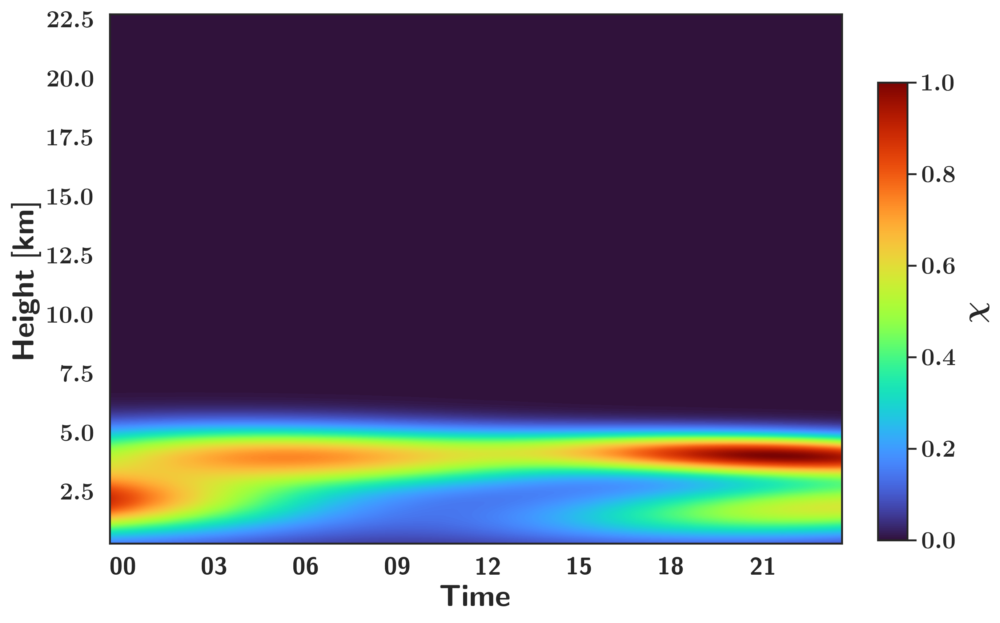

In [22]:
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(9, 6), sharey=True)
title = fr"density_component_2_{day_date.strftime('%Y-%m-%d')}"

cbar_ax = fig.add_axes([.91, .15, .03, .7])
density_ds.density.Height.attrs['units'] = density_ds.density.Height.attrs['units'].replace("km", r"\textbf{km}")
density_ds.density.sel(Component=1).plot(cmap='turbo', ax=ax, cbar_ax=cbar_ax,zorder=-20)
ax.set_rasterization_zorder(-10)
ax.xaxis.set_major_formatter(TIMEFORMAT)
ax.xaxis.set_tick_params(rotation=0)
cbar_ax.set_ylabel(r'$\chi$')
ax.set_ylabel(ax.get_ylabel().replace("Height", r'\textbf{Height}'))
ax.set_xlabel(ax.get_xlabel().replace("Time", r'\textbf{Time}'))
for tick in ax.xaxis.get_majorticklabels():
    tick.set_horizontalalignment("left")

ax.set_title("")
fig.tight_layout(rect=[0, 0, .9, 1])

plt.savefig(os.path.join('figures', title+'.jpeg'), bbox_inches = 'tight')
plt.savefig(os.path.join('figures', title+'.svg'), bbox_inches = 'tight')
plt.show()


Saving fig to figures\BG_orig_2017-04-04


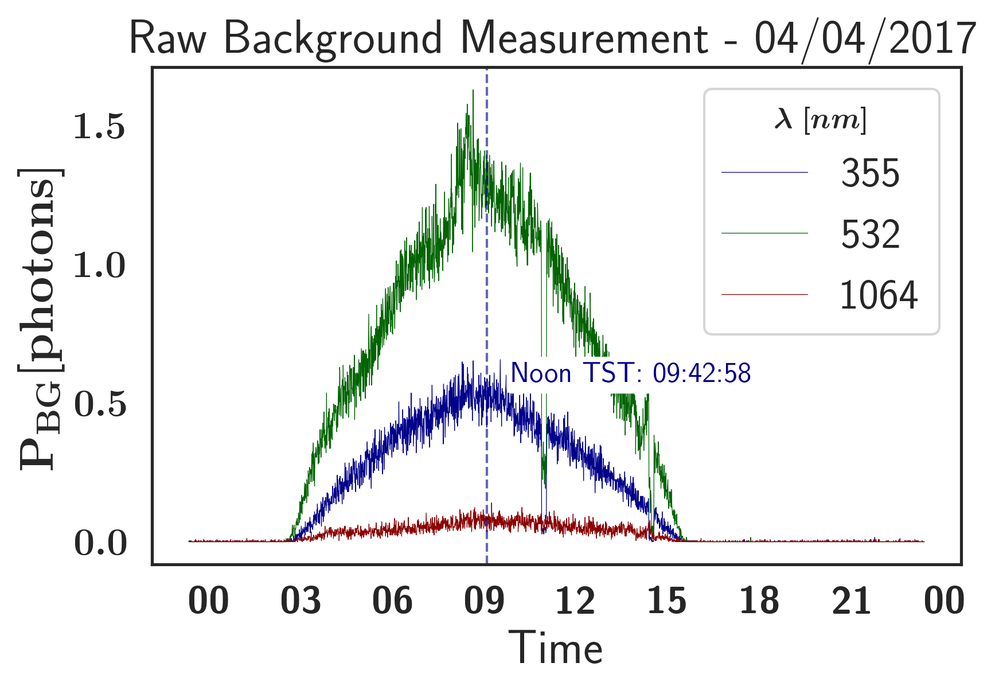

In [70]:
sns.set_palette(sns.color_palette(vis_utils.COLORS))
day_orig = datetime(2017,4,4)
ds_orig_path = xr_utils.get_prep_dataset_paths(station,day_orig,data_source='lidar'
                                               ,file_type='all')
lidar_4_4_ds = xr_utils.load_dataset(ncpath=ds_orig_path[0])

c_day = day_orig
fig, ax = plt.subplots(ncols=1, nrows=1)
ds = lidar_4_4_ds.p_bg.mean(dim='Height')

# %%
#ds.attrs['long_name'] = r'$\p_{\rm BG}$'

ds.plot(hue='Wavelength', ax=ax, linewidth=0.3)
ax.set_ylabel(r'$\rm P_{BG}[photons]$')
ax.xaxis.set_major_formatter(TIMEFORMAT)
ax.xaxis.set_tick_params(rotation=0)
for tick in ax.xaxis.get_majorticklabels():
    tick.set_horizontalalignment("left")
#ax.set_xlim([ds.Time.min(), ds.Time.max()]) # TODO: this command is not working
#ax.set_ybound([-.01, 2])
TST_noon = datetime(2017,4,4,9,42,58)
ax.axvline(x=TST_noon, ymin=0.0, ymax=1.0, alpha=.6,
           color='darkblue', linestyle='--', linewidth=1)
TST_noon_str = fr"Noon TST: {TST_noon.strftime('%H:%M:%S')}"
right_title = TST_noon_str
right_c = 'darkblue'
right_x = TST_noon
ax.annotate(right_title,
            fontweight='bold', fontsize=12, color=right_c,
            xy=(right_x, 0.6),
            ha="left", va="center",
            bbox=dict(boxstyle='round,pad=0.2', ec="none", fc=[1, 1, 1]),
            xytext=(right_x + timedelta(minutes=50), 0.6))

plt.tight_layout()
fig_path = os.path.join('figures', f"BG_orig_{c_day.strftime('%Y-%m-%d')}")
print(f"Saving fig to {fig_path}")
plt.savefig(fig_path + '.jpeg')
plt.savefig(fig_path + '.svg')
ax.set_title(f"{lidar_4_4_ds.p_bg.info} - {c_day.strftime('%d/%m/%Y')}")
plt.show()